In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import torchvision
import torch.nn.functional as F
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

In [3]:
IMAGE_SIZE = 256
BATCH_SIZE = 32
dataset_path = '/Users/ankitkumar/Desktop/Uni Stuff/3rd Year/Deep learning Lab/PlantVillage'

In [4]:
transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(20),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [5]:
dataset = datasets.ImageFolder(root=dataset_path, transform=transform)
class_names = dataset.classes

train_size = int(0.8 * len(dataset))
val_size = int(0.1 * len(dataset))
test_size = len(dataset) - (train_size + val_size)

train_dataset, val_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, val_size, test_size])

train_loader = DataLoader(dataset=train_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(dataset=test_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(dataset=val_dataset, batch_size=BATCH_SIZE, shuffle=True)

In [6]:
class_names

['Tomato_Bacterial_spot',
 'Tomato_Early_blight',
 'Tomato_Late_blight',
 'Tomato_Leaf_Mold',
 'Tomato_Septoria_leaf_spot',
 'Tomato_Spider_mites_Two_spotted_spider_mite',
 'Tomato__Target_Spot',
 'Tomato__Tomato_YellowLeaf__Curl_Virus',
 'Tomato__Tomato_mosaic_virus',
 'Tomato_healthy']

In [7]:
for images, labels in train_loader:
    # Your code here
    print(images.shape)
    print(labels.numpy())

torch.Size([32, 3, 256, 256])
[9 6 3 3 2 5 7 1 7 4 5 2 4 5 5 7 1 5 4 4 2 7 1 4 3 9 6 2 5 6 7 9]
torch.Size([32, 3, 256, 256])
[0 0 5 6 2 4 4 7 5 7 5 8 0 5 9 0 4 9 9 4 9 6 5 7 3 3 8 5 4 7 0 7]
torch.Size([32, 3, 256, 256])
[6 2 8 9 7 6 7 0 4 7 0 7 7 7 7 2 4 6 0 1 6 0 3 5 5 2 5 5 5 1 3 5]
torch.Size([32, 3, 256, 256])
[9 0 4 2 4 4 0 1 5 7 4 7 5 7 3 0 7 2 7 7 4 4 3 7 2 5 5 5 5 7 3 7]
torch.Size([32, 3, 256, 256])
[9 4 6 5 0 4 4 9 7 7 2 9 6 0 4 0 2 6 2 0 6 2 1 6 5 0 2 2 4 1 2 0]
torch.Size([32, 3, 256, 256])
[8 2 7 4 7 4 6 2 7 2 9 5 0 3 0 7 3 9 0 7 0 2 0 0 0 0 7 4 3 1 0 1]
torch.Size([32, 3, 256, 256])
[4 2 1 6 1 0 5 9 7 7 5 2 3 2 4 7 8 7 4 1 6 2 1 4 9 5 9 9 7 7 9 7]
torch.Size([32, 3, 256, 256])
[7 0 9 3 7 4 6 0 7 7 9 7 0 7 0 8 9 9 5 0 7 7 2 7 7 3 4 7 4 6 2 8]
torch.Size([32, 3, 256, 256])
[0 4 7 6 0 4 7 7 2 9 2 7 1 7 7 2 2 2 1 7 7 6 3 0 7 4 6 0 6 3 7 7]
torch.Size([32, 3, 256, 256])
[3 6 5 9 9 0 3 3 7 7 5 0 8 7 3 9 1 3 5 9 5 4 7 7 1 3 5 2 2 2 4 8]
torch.Size([32, 3, 256, 256])
[4 2 0 3 2

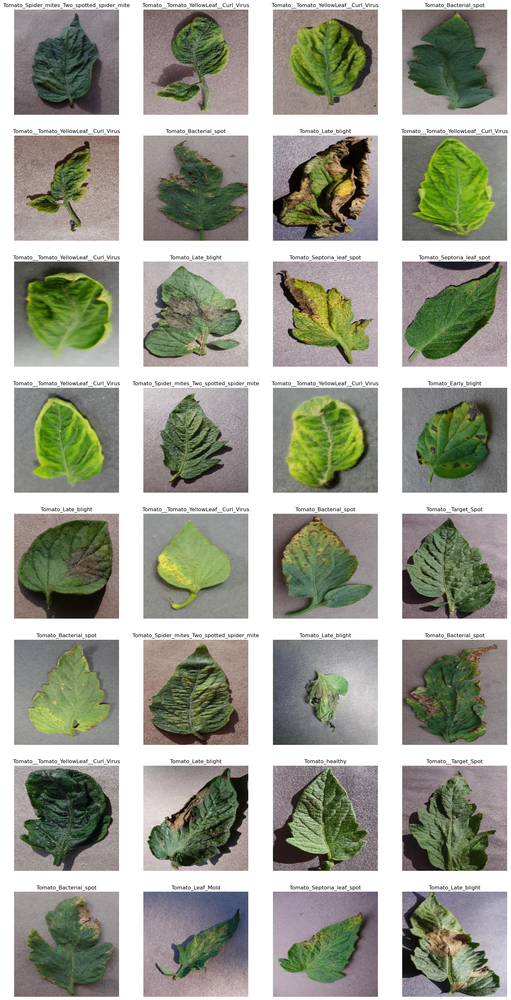

In [8]:
import math
transform2 = transforms.Compose([
    transforms.ToTensor(),
])

dataset1 = datasets.ImageFolder(root=dataset_path, transform = transform2)
train_size1 = int(0.8 * len(dataset))
val_size1 = int(0.1 * len(dataset))
test_size1 = len(dataset) - (train_size + val_size)

train_dataset1, val_dataset1, test_dataset1 = torch.utils.data.random_split(dataset1, [train_size1, val_size1, test_size1])

train_loader1 = DataLoader(dataset=train_dataset1, batch_size=BATCH_SIZE, shuffle=True)
test_loader1 = DataLoader(dataset=test_dataset1, batch_size=BATCH_SIZE, shuffle=True)
val_loader1 = DataLoader(dataset=val_dataset1, batch_size=BATCH_SIZE, shuffle=True)

for images_batch, labels_batch in train_loader1:
    num_images = len(images_batch)
    num_cols = 4
    num_rows = math.ceil(num_images / num_cols)

    plt.figure(figsize=(20, 5 * num_rows))
    for i in range(num_images):
        ax = plt.subplot(num_rows, num_cols, i + 1)
        image_np = np.transpose(images_batch[i].numpy(), (1, 2, 0))
        plt.imshow(image_np)
        class_name = class_names[labels_batch[i]]
        plt.title(class_name)
        plt.axis('off')
    plt.show()
    break 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


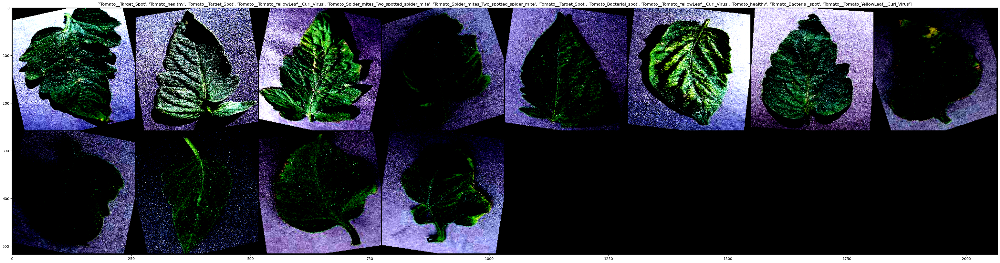

In [9]:
def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    plt.figure(figsize=(50, 50))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

# Get a batch of training data
inputs, classes = next(iter(train_loader))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs[:12])

imshow(out, title=[class_names[x] for x in classes[:12]])

In [10]:
class PlantDiseaseModel(nn.Module):
    def __init__(self, num_classes=3, init_image_size=256):
        super(PlantDiseaseModel, self).__init__()
        self.init_image_size = init_image_size 
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        self.feature_size = self.init_image_size // (2 ** 6)  
        self.linear_input_features = 64 * (self.feature_size ** 2)

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(self.linear_input_features, 64),  
            nn.ReLU(inplace=True),
            nn.Linear(64, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x


In [11]:
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
model = PlantDiseaseModel(num_classes = 10).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [12]:
model

PlantDiseaseModel(
  (features): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (9): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (10): ReLU(inplace=True)
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (15): Conv2d

In [29]:
device

device(type='mps')

In [15]:
num_epochs = 50

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_losses.append(running_loss / len(train_loader))
    train_accuracies.append(100 * correct / total)

    # Validation loop
    model.eval()
    val_running_loss = 0.0
    val_correct = 0
    val_total = 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()

    val_losses.append(val_running_loss / len(val_loader))
    val_accuracies.append(100 * val_correct / val_total)

    print(f'Epoch {epoch+1}, Loss: {running_loss / len(train_loader)}, '
          f'Validation Loss: {val_running_loss / len(val_loader)}, '
          f'Accuracy: {100 * correct / total}%')

Epoch 1, Loss: 0.7489962594913425, Validation Loss: 0.7587092185721678, Accuracy: 73.3525921299188%
Epoch 2, Loss: 0.5824052105446409, Validation Loss: 0.52194391059639, Accuracy: 80.1842598376015%
Epoch 3, Loss: 0.4293656058776706, Validation Loss: 0.4134592782002965, Accuracy: 84.93910056214865%
Epoch 4, Loss: 0.3582040685928076, Validation Loss: 0.3328118598928638, Accuracy: 87.58588382261087%
Epoch 5, Loss: 0.30064080842303814, Validation Loss: 0.32791052232770357, Accuracy: 89.59244222361025%
Epoch 6, Loss: 0.2679207258000784, Validation Loss: 0.24259738408613438, Accuracy: 90.76358525921299%
Epoch 7, Loss: 0.23184167950918103, Validation Loss: 0.27577224454166843, Accuracy: 91.84103685196752%
Epoch 8, Loss: 0.2128955076943312, Validation Loss: 0.24945335141291805, Accuracy: 92.74672079950031%
Epoch 9, Loss: 0.19995084665297644, Validation Loss: 0.2201606440812968, Accuracy: 93.34009993753904%
Epoch 10, Loss: 0.17832338638334277, Validation Loss: 0.2568507105404255, Accuracy: 93.9

In [16]:
# Test Phase
model.eval()
test_loss = 0.0
correct = 0
total = 0

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)
        test_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

test_loss /= len(test_loader)
accuracy = 100 * correct / total
print(f'Test Loss: {test_loss:.4f}, Test Accuracy: {accuracy:.2f}%')

Test Loss: 0.0793, Test Accuracy: 97.63%


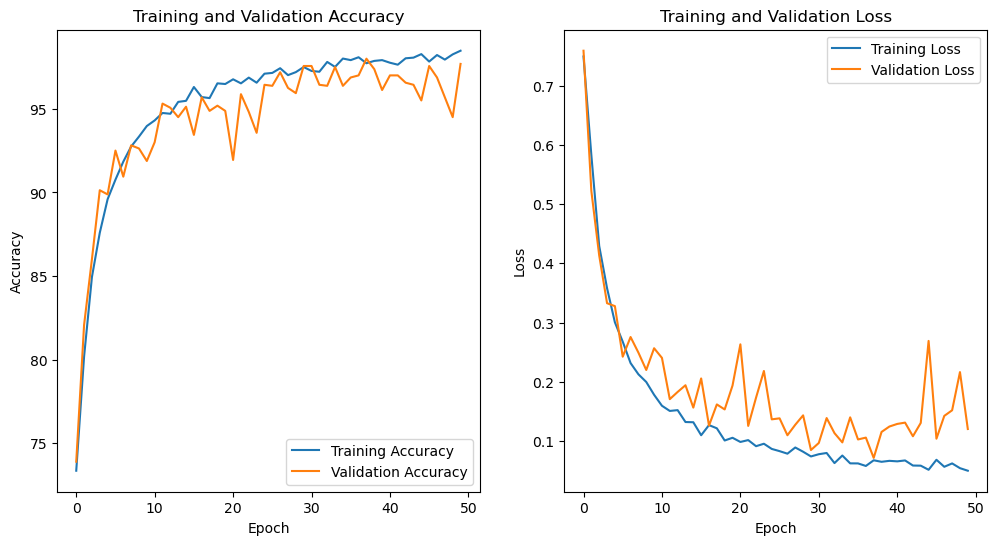

In [17]:
# Plot training and validation accuracy
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

In [19]:
def predict(model, img):
    img = img.unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = model(img)

    outputs_np = outputs.cpu().numpy()
    predicted_class_index = np.argmax(outputs_np)
    predicted_class = class_names[predicted_class_index]
    confidence = round(100 * torch.nn.functional.softmax(outputs, dim=1).squeeze(0)[predicted_class_index].item(), 2)

    return predicted_class, confidence


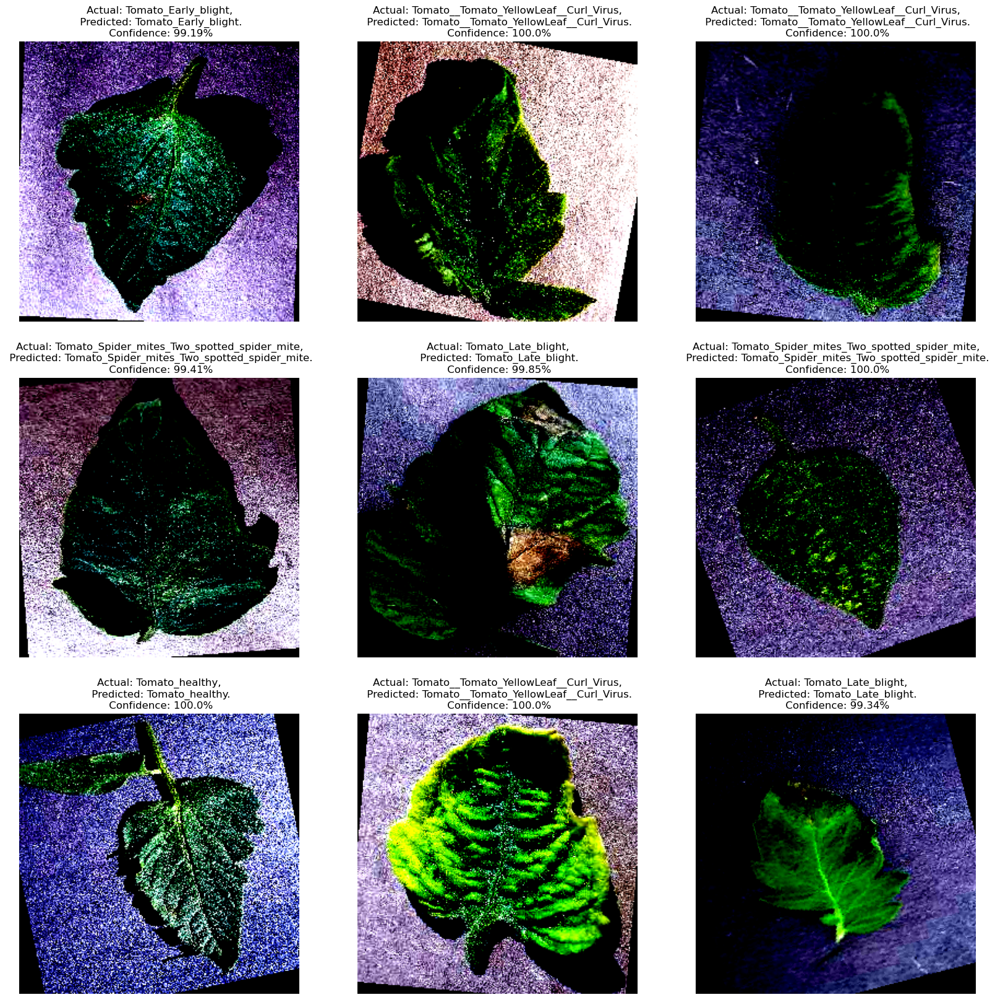

In [21]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 20))
model.eval() 
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        for i in range(min(9, len(images))):  # Iterate up to the minimum of 9 or the number of images in the batch
            ax = plt.subplot(3, 3, i + 1)
            # Normalize the image tensor to be in the range [0, 1]
            image_np = images[i].cpu().numpy().transpose((1, 2, 0))
            plt.imshow(image_np.clip(0, 1))  # Clip pixel values to [0, 1]
            predicted_class, confidence = predict(model, images[i])
            
            actual_class = class_names[labels[i].item()] 
            plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
            plt.axis("off")

plt.savefig('plot_final.jpg')
plt.show()


In [23]:
model.eval()
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)


In [24]:
def predict_pytorch(model, img, class_names, transform):
    # img is expected to be a PIL Image
    # Apply the same transform as during training/testing
    img_transformed = transform(img).unsqueeze(0)  # Add batch dimension

    # Move the image tensor to the same device as the model
    device = next(model.parameters()).device
    img_transformed = img_transformed.to(device)

    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():
        outputs = model(img_transformed)
        probabilities = torch.nn.functional.softmax(outputs, dim=1)
        confidence, predicted = torch.max(probabilities, 1)
        predicted_class = class_names[predicted.item()]
        confidence = round(100 * confidence.item(), 2)

    return predicted_class, confidence

In [25]:
import os

checkpoint_dir = '/Users/ankitkumar/Desktop/Uni Stuff/3rd Year/Deep learning Lab'

os.makedirs(checkpoint_dir, exist_ok=True)

checkpoint_file = os.path.join(checkpoint_dir, 'model_checkpoint_final.pth')

torch.save({
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'epoch_loss' : test_loss,
    'epoch_acc' : accuracy,
}, checkpoint_file)

print("Checkpoint created successfully at:", checkpoint_file)


Checkpoint created successfully at: /Users/ankitkumar/Desktop/Uni Stuff/3rd Year/Deep learning Lab/model_checkpoint_final.pth
